<h1>Analisis exploratorio y modelado</h1>
<p>Proyecto aplicado - Rescindidos Funeraria La Aurora</´p>
<p>Carlos Felipe Cortés Cataño - Carlos Luis Mora Cañas </p>

## Librerías, datos, variables y estadisticas generales

In [736]:
import warnings
warnings.filterwarnings("ignore")
#Manipulación datos
import numpy as np
import pandas as pd
import math
#Graficas
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
from sklearn.metrics import ConfusionMatrixDisplay
#Selección variables
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind
#Balanceo
from imblearn.over_sampling import SMOTE
from sklearn.utils import resample
#Modelamiento
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import recall_score, f1_score,roc_auc_score
from sklearn.model_selection import GridSearchCV


In [512]:
data = pd.read_csv("../data/outputs/desercion_version_1.csv")
data["estado"] = data["estado"].replace(" ", "", regex=True)
data.head(2)


,codigoPrograma,edad,qPersonas,qMascotas,localidad,valorUltimaCuota,idTomador,diaPagoCuota,inactivoadmin,inactivocosto,...,independiente,oficiosVarios,pensionado,esposa,esposo,hermana,hermano,hija,hijo,madre
0,11472,59,6,0,manizales,17320.0,24626035.0,2.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0
1,27121,84,6,0,manizales,27200.0,24269841.0,18.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0


In [513]:
data.shape


(27587, 48)

Nuevo tamaño del conjunto de datos

In [514]:
#Hay valor de cuota con simbolo negativo
data = data[(data["valorUltimaCuota"] > 0) & (data["valorUltimaCuota"] < 1200000)]
#Existen más de 1 esposa y más de una madre
data = data[(data["madre"] < 2) & (data["esposa"] < 2) & (data["esposo"] < 2)]
shape = data.shape
print("Cuál es el número de registros?")
print(shape[0])
print("Cuál es el número de atributos?")
print(shape[1])


Cuál es el número de registros?
27411
Cuál es el número de atributos?
48


In [515]:
data.columns

Index(['codigoPrograma', 'edad', 'qPersonas', 'qMascotas', 'localidad',
       'valorUltimaCuota', 'idTomador', 'diaPagoCuota', 'inactivoadmin',
       'inactivocosto', 'inactivofallecimiento', 'inactivoinactivo',
       'inactivoincumplimiento', 'inactivoinfluencia', 'inactivomala',
       'inactivorecuperado', 'inactivoubicacion', 'inactivovoluntario',
       'duracion', 'estado', 'qFacturas', 'promPercDesc', 'qDescOtorgado',
       'cambioCuota', 'gestionCambioCuotas', 'gestionExitosa',
       'gestionNoExitoso', 'gestionNoEjecutada', 'sentimiento',
       'promedioEdadInscritos', 'nombrePlan', 'profesionTomador', 'agricultor',
       'comerciante', 'docente', 'empleado', 'estudiante', 'hogar',
       'independiente', 'oficiosVarios', 'pensionado', 'esposa', 'esposo',
       'hermana', 'hermano', 'hija', 'hijo', 'madre'],
      dtype='object')

In [516]:
variable_objetivo = "estado"
variable_llave = "codigoPrograma"
variables_numericas = ["edad", "valorUltimaCuota",
                       "diaPagoCuota", "duracion", "qFacturas", "promPercDesc", "qDescOtorgado",
                       "cambioCuota", "gestionCambioCuotas", "gestionExitosa", "gestionNoExitoso", "gestionNoEjecutada",
                       "promedioEdadInscritos"]
variables_categoricas = ["qPersonas", "qMascotas",
                         "localidad", "inactivoadmin", "inactivocosto", "inactivofallecimiento",
                         "inactivoinactivo", "inactivoincumplimiento", "inactivoinfluencia", "inactivomala", "inactivorecuperado",
                         "inactivoubicacion", "inactivovoluntario", "sentimiento", "nombrePlan", "profesionTomador", "agricultor",
                         "comerciante", "docente", "empleado", "estudiante", "hogar", 'independiente', 'oficiosVarios', 'pensionado', 'esposa', 'esposo',
                         'hermana', 'hermano', 'hija', 'hijo', 'madre']
print("Medidas de centralidad y desviación para atributos numéricos:")

for var in variables_numericas:
    data[var] = pd.to_numeric(data[var])

data[variables_numericas].describe().T


Medidas de centralidad y desviación para atributos numéricos:


,count,mean,std,min,25%,50%,75%,max
edad,27411.0,54.202583,13.589671,19.0000,44.0,55.000000,64.000000,9.800000e+01
valorUltimaCuota,27411.0,32863.574172,50725.966710,3.0792,18500.0,20800.000000,27800.000000,1.050000e+06
diaPagoCuota,27411.0,14.869724,9.245194,1.0000,8.0,14.000000,22.000000,3.100000e+01
duracion,27411.0,3664.608405,2870.981237,1.0000,1258.0,2898.000000,5647.000000,1.107300e+04
qFacturas,27411.0,10.099048,4.422737,1.0000,8.0,12.000000,12.000000,4.600000e+01
promPercDesc,27411.0,4.415052,7.601433,0.0000,0.0,0.000000,7.500000,2.026667e+02
qDescOtorgado,27411.0,2.761373,4.868778,0.0000,0.0,0.000000,4.000000,4.500000e+01
cambioCuota,27411.0,1154.284647,12847.660686,-425000.0000,0.0,0.000000,2600.000000,5.263860e+05
gestionCambioCuotas,27411.0,0.172631,0.693197,0.0000,0.0,0.000000,0.000000,5.800000e+01
gestionExitosa,27411.0,4.311846,6.174308,0.0000,0.0,1.000000,7.000000,4.100000e+01


## Selección de variables

Para variables númericas usamos una prueba T Student para revisar si existe diferencia significativa entre grupos de Activos e Inactivos. Esta diferencia permitirá al modelo aprender posteriormente

In [517]:
#Calculo T-student y extracción variables significativas
titulos_significativos = []
titlos_no_significativos = []
umbral_significativo = 0.01
for variable_a_evaluar in variables_numericas:
    grupo_1 = data[data[variable_objetivo] == "Activo"][variable_a_evaluar]
    grupo_2 = data[data[variable_objetivo] == "Inactivo"][variable_a_evaluar]
    t_statistic, p_value = ttest_ind(grupo_1, grupo_2)
    if p_value < umbral_significativo:
        titulos_significativos.append(variable_a_evaluar)
    else:
        titlos_no_significativos.append(variable_a_evaluar)
#Representación gráfica medias
color = 0
columnas = 3
filas = math.ceil(len(titulos_significativos)/columnas)

numericas = make_subplots(rows=filas, cols=columnas,
                          subplot_titles=[titulo.capitalize() for titulo in titulos_significativos])
columna = 1
fila = 1

for variable_a_evaluar in titulos_significativos:
    # Análisis t de Student
    grupo_1 = data[data[variable_objetivo] == "Activo"][variable_a_evaluar]
    grupo_2 = data[data[variable_objetivo] == "Inactivo"][variable_a_evaluar]
    numericas.add_trace(go.Box(
        y=data[variable_a_evaluar], x=data[variable_objetivo],
        name=variable_a_evaluar, marker_color="indianred", boxpoints=False, line_color="lightslategray"), col=columna, row=fila)
    color += 1
    if (fila < filas) and (columna < columnas):
        columna += 1
    elif (fila < filas) and (columna == columnas):
        fila += 1
        columna = 1
    elif (fila == filas) and (columna < columnas):
        columna += 1
        
numericas.update_layout(
    showlegend=False, title_text="Variables númericas significativas", height=700,xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)')
numericas.show()
titlos_no_significativos


['cambioCuota', 'gestionCambioCuotas']

Después de la prueba T Student, obtenemos que nuestras variables númericas parecen tener una diferencia significativa entre sus medias, excepto por cambios en las cuotas y la gestión realizada para estos cambios. Para el caso de la edad se espera que entre mayor edad tenga el tomador(promedio 7 años) sea más propenso a tener el programa activo, el valor de su ultima cuota evidencia que entre mayor es el valor es más propenso a que tenga el plan activo, sin embargo, esta variable podría ser afectada por mucha más cantidad de factores como en que fecha se cancelo el plan, la cantidad de servicios y por lo tanto no se tendrá en cuenta en el modelo. Por otro lado, el día de pago ideal acordado parece tener una incidencia de 1 día en la rapidez con que se paga el plan. La duración del plan también tiene una incidencia, donde después de 2000 días se podría ser más propenso a tener el plan activo, así mismo lo evidencia la cantidad de facturas generadas, entre más facturas o tiempo se evidencia mayor cantidad de planes activos, para evitar información redudante solo tendremos en cuenta duración. Para el caso de descuentos otorgados se evidencia que ya sea en porcentaje o valor afecta la actividad o inactividad de un tomador, en especial tomaremos en cuenta el porcentaje debido a que valores relativos podrían compararse atraves del tiempo. Para el caso de las gestiones se evidencia que entre más gestiones se realizan sean exitosas o no, es más propenso a estar inactivo. Finalmente, el promedio de las edades de los inscritos parece ser menor para los beneficiarios de programas activos. Así pues las variables númericas que se tendrían en cuenta en el modelo son las siguientes:

In [518]:
variables_modelo = titulos_significativos
variables_modelo.remove("valorUltimaCuota")
variables_modelo.remove("qDescOtorgado")
variables_modelo.remove("qFacturas")
variables_modelo


['edad',
 'diaPagoCuota',
 'duracion',
 'promPercDesc',
 'gestionExitosa',
 'gestionNoExitoso',
 'gestionNoEjecutada',
 'promedioEdadInscritos']

Revisión de correlación entre variables para evitar multicolinealidad.Correlación 0.70 = multicolinealidad

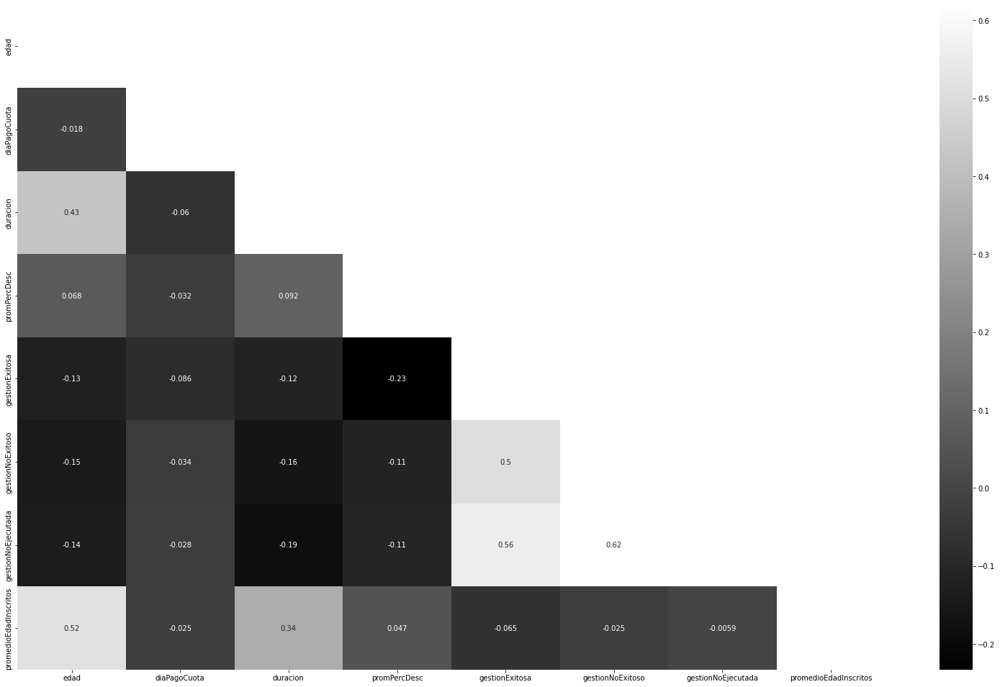

In [519]:
upp_mat = np.triu(data[variables_modelo].corr())

correlation_matrix_a, ax = plt.subplots(figsize=(27, 17))
sns.heatmap(data[variables_modelo].corr(),
            annot=True, cmap='gray', mask=upp_mat)
correlation_matrix_a.show()


No se evidencia valor que supere umbral de multicolinealidad

Para variables categorícas usamos una prueba Chicuadrado para revisar si existe diferencia significativa entre grupos de Activos e Inactivos. Así mismo agrupamos en una variable denominada otros, aquellos que no superen el 2% de los datos para reducir el número de categorías

In [520]:

#Agrupación categoría otros, calculo chicuadrado y extracción variables significativas
titulos_significativos = []
titulos_no_significativos = []
# Definir umbral de baja frecuencia 1%
umbral = data.shape[0]*0.01
for variable_a_evaluar in variables_categoricas:
    data[variable_a_evaluar] = data[variable_a_evaluar].astype(str)
    frecuencia = data[variable_a_evaluar].value_counts()
    # Identificar categorías con baja frecuencia
    categorias_baja_frecuencia = frecuencia[frecuencia < umbral].index
    # Reemplazar categorías con baja frecuencia por un valor único
    data[variable_a_evaluar].loc[data[variable_a_evaluar].isin(
        categorias_baja_frecuencia)] = 'Otros'
    #Creación de la tabla de contingencia para la prueba chicuadrado
    contingency_table = pd.crosstab(
        data[variable_a_evaluar], data[variable_objetivo])
    # Realizar prueba de chi-cuadrado
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    contingency_table = contingency_table.reset_index()
    #Si la variable otros no tiene muchos datos, procederemos a descatarla por la poca cantidad de muestras
    if p_value < umbral_significativo:
        if "Otros" in data[variable_a_evaluar].unique():
            if len(data[variable_a_evaluar].unique()) > 2 and\
                len(data[data[variable_a_evaluar] != "0.0"][variable_a_evaluar]) > umbral:
                titulos_significativos.append(variable_a_evaluar)
            else:
                if len(data[data[variable_a_evaluar] != "0.0"][variable_a_evaluar]) > umbral:
                    titulos_significativos.append(variable_a_evaluar)
                else:
                    titulos_no_significativos.append(variable_a_evaluar)
        elif "Otros" not in data[variable_a_evaluar].unique():
            titulos_significativos.append(variable_a_evaluar)
        else:
            titulos_no_significativos.append(variable_a_evaluar)
    else:
        titulos_no_significativos.append(variable_a_evaluar)
            
#Representación gráfica medias
color = 0
columnas = 3
filas = math.ceil(len(titulos_significativos)/columnas)
categoricas = make_subplots(rows=filas, cols=columnas,
                            subplot_titles=[titulo.capitalize() for titulo in titulos_significativos])
columna = 1
fila = 1
for variable_a_evaluar in titulos_significativos:
    # Análisis Chicuadrado
    contingency_table = pd.crosstab(
        data[variable_a_evaluar], data[variable_objetivo]).reset_index()
    categoricas.add_trace(
        go.Bar(y=contingency_table["Activo"],
               x=contingency_table[variable_a_evaluar], name="Activo", marker_color='lightslategray'), col=columna, row=fila)
    categoricas.add_trace(
        go.Bar(y=contingency_table["Inactivo"],
               x=contingency_table[variable_a_evaluar], name="Inactivo", marker_color='indianred'), col=columna, row=fila)
    color += 1
    if (fila < filas) and (columna < columnas):
        columna += 1
    elif (fila < filas) and (columna == columnas):
        fila += 1
        columna = 1
    elif (fila == filas) and (columna < columnas):
        columna += 1

categoricas.update_layout(
    showlegend=False, title_text="Variables categorícas significativas", height=2000,
    hovermode="x",barmode='stack', xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='white'),
    paper_bgcolor='rgb(233,233,233)',
    plot_bgcolor='rgb(233,233,233)')
categoricas.show()
titulos_no_significativos


['inactivocosto',
 'inactivofallecimiento',
 'inactivoincumplimiento',
 'inactivomala',
 'inactivorecuperado',
 'inactivoubicacion']

Después de la prueba Chicuadrado, observamos que en general la inactividad, no evidencia una diferencia de media entre las diferentes categorias, sin embargo, la inactividad voluntaria, por influencia, por falla administrativa o sin razón especificada evidencia muestras que se encuentran activas y que son muy inferiores a lo que sería no tener inactividad por esta razón. Por otro lado, la cantidad de personas y mascotas representa una diferencia para ser activo o no, en especifico, los casos de 0 mascotas, 0 personas y 5 personas presentan mayor cantidad de inactivos, frente a las otras categorías. También la localidad de Manizales historicamente a presentado mayor cantidad de inactivos. En cuanto a las profesiones que tiene el tomador como sus beneficiarios evidencia que hay profesiones que son menos propensas a desertar como son pensionados, agriculores y comerciantes. Se descatará el sentimiento porque la diferencia de grupos no hace mucho sentido, se deja como recomendación mejorar el modelo para captar mejor el sentimiento también explorar una forma de dejar comentarios que evidencien el sentimiento de los clientes.El nombre del plan permite ver mayor cantidad de actividad como es el caso de remanso.Finalmente, tener familiares afiliados y etiquetados si permite evidenciar mayor cantidad de planes activos en contraste a aquellos que no tienen afiliados familiares.Asi pues las variables a incluir en el modelo son las siguientes:


In [521]:
variables_modelo = titulos_significativos+variables_modelo
variables_modelo.remove("sentimiento")
variables_modelo


['qPersonas',
 'qMascotas',
 'localidad',
 'inactivoadmin',
 'inactivoinactivo',
 'inactivoinfluencia',
 'inactivovoluntario',
 'nombrePlan',
 'profesionTomador',
 'agricultor',
 'comerciante',
 'docente',
 'empleado',
 'estudiante',
 'hogar',
 'independiente',
 'oficiosVarios',
 'pensionado',
 'esposa',
 'esposo',
 'hermana',
 'hermano',
 'hija',
 'hijo',
 'madre',
 'edad',
 'diaPagoCuota',
 'duracion',
 'promPercDesc',
 'gestionExitosa',
 'gestionNoExitoso',
 'gestionNoEjecutada',
 'promedioEdadInscritos']

## Modelo Inicial

Copia de Dataset para prepración y modelado,,encoder para poder ser usado en el modelo a variables categoricas, cambio variable 1 para inactivo y 0 para activo y selección de variables

In [550]:
data_model = data.copy()
labelencoder = LabelEncoder()
for column in variables_categoricas:
    data_model[column] = labelencoder.fit_transform(data_model[column])
data_model= data_model[variables_modelo+["estado"]]
data_model["estado"] = data_model["estado"].replace("Inactivo", 1).replace("Activo", 0)
data_model["estado"].unique()


array([0, 1])

Regresión logistica para ver los pesos de los atributos y metricas iniciales con modelo básico

In [611]:
#Definición de algoritmo para todos los modelos
logisticRegr = LogisticRegression(solver="lbfgs", max_iter=500, tol=0.01)
X_train, X_test, y_train, y_test = train_test_split(
    data_model.drop(['estado'], axis=1), data_model[['estado']], test_size=0.30, random_state=100)
print("Tamaño sets entrenamiento")
print(X_train.shape, y_train.shape)
print("Tamaño sets pruebas")
print(X_test.shape, y_test.shape)


Tamaño sets entrenamiento
(19187, 33) (19187, 1)
Tamaño sets pruebas
(8224, 33) (8224, 1)


Metricas modelo base
     conteo  porcentaje
0.0    7272        88.0
1.0     952        12.0
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      6925
           1       0.88      0.64      0.74      1299

    accuracy                           0.93      8224
   macro avg       0.91      0.81      0.85      8224
weighted avg       0.93      0.93      0.93      8224

Variables significativas: 
['localidad' 'nombrePlan' 'agricultor' 'comerciante' 'docente' 'empleado'
 'estudiante' 'hogar' 'independiente' 'oficiosVarios' 'pensionado'
 'esposa' 'esposo' 'hermana' 'hermano' 'hija' 'hijo' 'madre' 'edad'
 'diaPagoCuota' 'duracion' 'promPercDesc' 'gestionExitosa'
 'gestionNoEjecutada' 'promedioEdadInscritos']


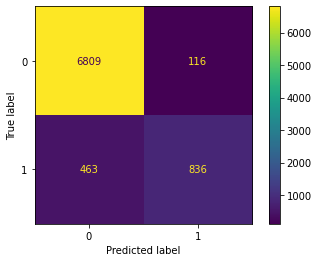

In [612]:
logisticRegr.fit(X_train, y_train)
predictions = logisticRegr.predict(X_test)
#Resultados 
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=logisticRegr.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
significancia = pd.DataFrame(columns=["variable"])
significancia["variable"] = data_model.drop("estado", axis=1).columns
significancia["coeficiente"] = logisticRegr.coef_[0]
significancia["coeficiente"] = significancia["coeficiente"].where(
    significancia["coeficiente"] > 0.05, "significante")
logisticsig = significancia[significancia["coeficiente"]
                            == "significante"]["variable"].values
print("Variables significativas: ")
print(logisticsig)


Revisando si hay cambio en metricas con solo variables significativas


Tamaño sets entrenamiento
(19187, 25) (19187, 1)
Tamaño sets pruebas
(8224, 25) (8224, 1)
Metricas modelo base
     conteo  porcentaje
0.0    7272        88.0
1.0     952        12.0
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      6925
           1       0.84      0.61      0.71      1299

    accuracy                           0.92      8224
   macro avg       0.88      0.80      0.83      8224
weighted avg       0.92      0.92      0.92      8224



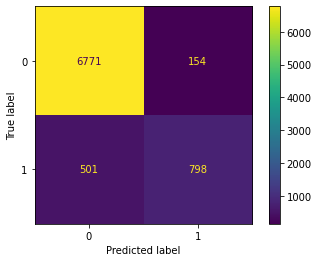

In [613]:
df = data_model.copy()[np.append(logisticsig,"estado")]
logisticRegr1 = LogisticRegression(solver="lbfgs", max_iter=500, tol=0.01)
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(['estado'], axis=1), df[['estado']], test_size=0.30, random_state=100)
print("Tamaño sets entrenamiento")
print(X_train.shape, y_train.shape)
print("Tamaño sets pruebas")
print(X_test.shape, y_test.shape)
logisticRegr1.fit(X_train, y_train)
predictions = logisticRegr1.predict(X_test)
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=logisticRegr1.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()


Baja solo 3 puntos porcentuales nuestro recall y f1 score disminuyendo 8 atributos, sin embargo evidenciamos una disminución de 8 atributos. Las variables que identifica como no significativas son:

In [659]:
data_model.columns[~data_model.columns.isin(logisticsig)]


Index(['qPersonas', 'qMascotas', 'inactivoadmin', 'inactivoinactivo',
       'inactivoinfluencia', 'inactivovoluntario', 'profesionTomador',
       'gestionNoExitoso', 'estado'],
      dtype='object')

Dado este resultado, procedemos a eliminar inicialmente gestionNoExitoso, ya que tiene una correlación alta con gestión no ejecutada en 0.61. Eliminamos de igual manera los inactivos ya que tenemos pocas muestras en todos los casos menos en inactivoinactivo, donde este ultimo no especifica la razón y podría tener una combinación de razones voluntarias e involuntarias. Eliminamos también profesión Tomador debido a la gran cantidad de registros inactivos con profesión no identificada. Conservamos qPersonas y qMascotas, estas caracteristicas por reglas de negocio deberían afectar porque significa mayor o menor beneficio para el usuario y podría estar afectada por la gran cantidad de ejemplos donde se reportan 0 como cantidad de personas y mascotas.

In [662]:
data_model = data_model.drop(['inactivoadmin', 'inactivoinactivo',
                              'inactivoinfluencia', 'inactivovoluntario', 'profesionTomador',
                              'gestionNoExitoso'], axis=1)


## PCA

In [663]:
X_train, X_test, y_train, y_test = train_test_split(data_model.drop(['estado'], axis=1),
                                                    data_model['estado'], test_size=0.30, random_state=100)
print("Tamaño set entrenamiento")
print(X_train.shape, y_train.shape)
print("Tamaño set pruebas")
print(X_test.shape, y_test.shape)


Tamaño set entrenamiento
(19187, 28) (19187,)
Tamaño set pruebas
(8224, 28) (8224,)


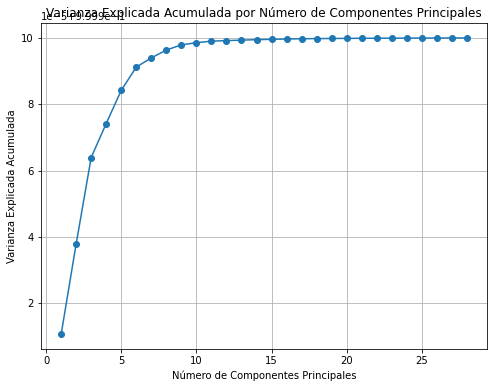

In [664]:
pca = PCA()
pca.fit(X_train)

# Graficar la varianza explicada acumulada
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1),
         cumulative_variance_ratio, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Explicada Acumulada')
plt.title('Varianza Explicada Acumulada por Número de Componentes Principales')
plt.grid()
plt.show()


El codo se encuentra en 6 componentes

Metricas modelo base
     conteo  porcentaje
0.0    7653        93.0
1.0     571         7.0
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      6925
           1       0.73      0.32      0.44      1299

    accuracy                           0.87      8224
   macro avg       0.80      0.65      0.69      8224
weighted avg       0.86      0.87      0.85      8224



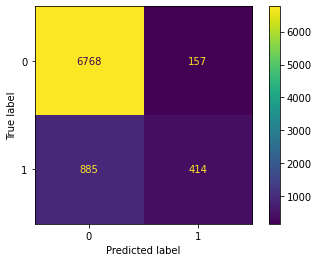

In [665]:
pca = PCA(6)

newdf_train = pca.fit_transform(X_train)
features_train = pd.DataFrame(newdf_train)

newdf_valid = pca.transform(X_test)
features_valid = pd.DataFrame(newdf_valid)
logisticRegr.fit(features_train, y_train)
predictions = logisticRegr.predict(features_valid)
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=logisticRegr.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()


Con los 6 componentes identificados en el codo mantenemos nuestras metricas recall y F1-score para usuario inactivos disminuye significativamente. Dado que el PCA afecta la interpretación y dismiye nuestro score para inactivos, no afectamos el dataframe.

## Balanceo

Observamos que se entregan datos desbalanceados. Calcular la matriz de correlación entre los atributos de entrada

### Balanceo over_sampling 50-50

<AxesSubplot:>

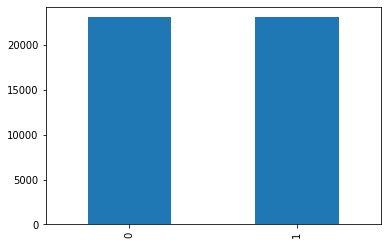

In [691]:
sm = SMOTE()  # para variables predictoras numéricas

x = data_model.drop('estado', axis=1)
y = data_model['estado']
X_bal, Y_bal = sm.fit_resample(x, y)

# Creamos un dataframe con los resultados
data_1 = pd.DataFrame(columns=x.columns.values, data=X_bal)
data_1['estado'] = Y_bal
data_1['estado'].value_counts().plot(kind='bar')


In [723]:
# Dividir el conjunto de datos en conjuntos de entrenamiento y test # CON Balanceo

X_train_bal, X_test_bal, y_train_bal, y_test_bal = train_test_split(
    data_1.drop(['estado'], axis=1), data_1['estado'], test_size=0.30, random_state=100)

scaler = StandardScaler()
X_train_bal = scaler.fit_transform(X_train_bal)
X_test_bal = scaler.transform(X_test_bal)

print("Tamaño set entrenamiento")
print(X_train_bal.shape, y_train_bal.shape)
print("Tamaño set pruebas")
print(X_test_bal.shape, y_test_bal.shape)


Tamaño set entrenamiento
(32349, 27) (32349,)
Tamaño set pruebas
(13865, 27) (13865,)


Metricas modelo base
     conteo  porcentaje
0.0    7020        51.0
1.0    6845        49.0
              precision    recall  f1-score   support

           0       0.89      0.90      0.89      6920
           1       0.90      0.89      0.89      6945

    accuracy                           0.89     13865
   macro avg       0.89      0.89      0.89     13865
weighted avg       0.89      0.89      0.89     13865



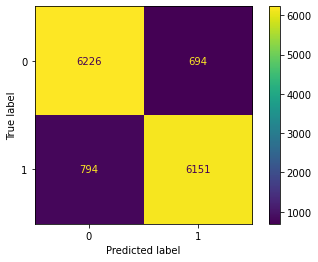

In [724]:
logisticRegr = LogisticRegression(solver="lbfgs", max_iter=500, tol=0.01)
logisticRegr.fit(X_train_bal, y_train_bal)
predictions = logisticRegr.predict(X_test_bal)
#Resultados
cm = confusion_matrix(y_test_bal, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=logisticRegr.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test_bal, predictions)
print(modelo_base_metrics)
confusion.plot()


Nuestro recall y f1-score aumentaron significativamente a 89 respectivamente, sin embargo, aumentamos también las muestras de entrenamiento de 19 mil a 32 mil, muestras que no existen. Revisemos otras tecnicas antes de proceder a usar esta tecnica

### Balanceo Random under_sampling 50-50

In [725]:
def random_undersample(X, y, majority_class):
    # Separa las instancias de la clase mayoritaria y minoritaria
    majority_X = X[y == majority_class]
    minority_X = X[y != majority_class]
    minority_y = y[y != majority_class]

    # Realiza undersampling aleatorio en la clase mayoritaria
    majority_X_undersampled = resample(majority_X,
                                       replace=False,  # No reemplazar las instancias
                                       # Igual número de instancias que la clase minoritaria
                                       n_samples=len(minority_y),
                                       random_state=42)  # Fijar una semilla para reproducibilidad

    # Combina las instancias undersampled de la clase mayoritaria con la clase minoritaria
    X_undersampled = np.concatenate([majority_X_undersampled, minority_X])
    y_undersampled = np.concatenate(
        [np.repeat(majority_class, len(minority_y)), minority_y])

    return X_undersampled, y_undersampled


<AxesSubplot:xlabel='0'>

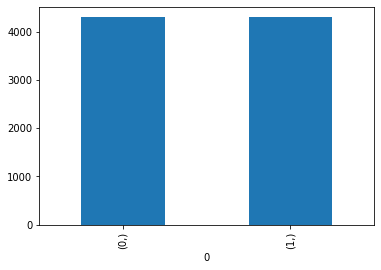

In [726]:
X_undersampled, y_undersampled = random_undersample(
    data_model.drop("estado", axis=1), data_model["estado"], 0)
pd.DataFrame(y_undersampled).value_counts().plot(kind='bar')


In [727]:
X_train, X_test, y_train, y_test = train_test_split(
    X_undersampled, y_undersampled, test_size=0.30, random_state=100)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
print("Tamaño sets entrenamiento")
print(X_train.shape, y_train.shape)
print("Tamaño sets pruebas")
print(X_test.shape, y_test.shape)


Tamaño sets entrenamiento
(6025, 27) (6025,)
Tamaño sets pruebas
(2583, 27) (2583,)


Metricas modelo base
     conteo  porcentaje
0.0    1368        53.0
1.0    1215        47.0
              precision    recall  f1-score   support

           0       0.80      0.86      0.83      1275
           1       0.85      0.79      0.82      1308

    accuracy                           0.82      2583
   macro avg       0.82      0.82      0.82      2583
weighted avg       0.82      0.82      0.82      2583

Variables significativas: 
['localidad' 'agricultor' 'comerciante' 'docente' 'empleado' 'estudiante'
 'hogar' 'independiente' 'oficiosVarios' 'pensionado' 'esposa' 'esposo'
 'hermana' 'hermano' 'hija' 'hijo' 'madre' 'edad' 'duracion'
 'promPercDesc' 'gestionExitosa']


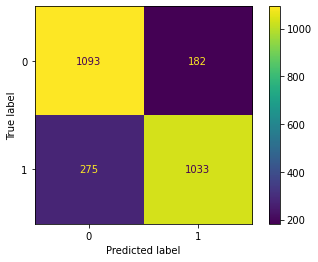

In [728]:
logisticRegr = LogisticRegression(solver="lbfgs", max_iter=500, tol=0.01)
logisticRegr.fit(X_train, y_train)
predictions = logisticRegr.predict(X_test)
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=logisticRegr.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
significancia = pd.DataFrame(columns=["variable"])
significancia["variable"] = data_model.drop("estado", axis=1).columns
significancia["coeficiente"] = logisticRegr.coef_[0]
significancia["coeficiente"] = significancia["coeficiente"].where(
    significancia["coeficiente"] > 0.05, "significante")
logisticsig = significancia[significancia["coeficiente"]
                            == "significante"]["variable"].values
print("Variables significativas: ")
print(logisticsig)


In [729]:
data_model.columns[~data_model.columns.isin(logisticsig)]


Index(['qPersonas', 'qMascotas', 'nombrePlan', 'diaPagoCuota',
       'gestionNoEjecutada', 'promedioEdadInscritos', 'estado'],
      dtype='object')

En este caso nuestro recall y F1-score también aumento significativamente, disminuimos nuestra cantidad de muestras a 6000, no se logra las metricas de un sobremuestreo pero son ejemplos reales. Nuestro modelo agrega nuevas variables a variables no significativas, sin embargo, son variables donde graficamente logramos evidenciar diferencia de muestras y diferencia de grupos o etiquetas, no lo eliminaremos.

## Comparación modelos y validación cruzada

### XGB

Metricas modelo base
     conteo  porcentaje
0.0    1389        54.0
1.0    1194        46.0
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      1275
           1       0.93      0.85      0.88      1308

    accuracy                           0.89      2583
   macro avg       0.89      0.89      0.89      2583
weighted avg       0.89      0.89      0.89      2583

Resultados de la Validación Cruzada:
Fold 1: 0.8497
Fold 2: 0.8497
Fold 3: 0.8397
Fold 4: 0.8230
Fold 5: 0.8283
Promedio de Puntajes de Validación Cruzada: 0.838120756816917


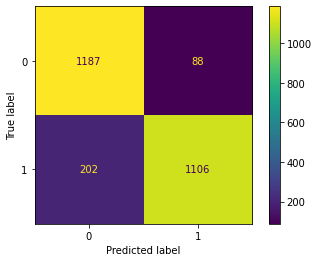

In [730]:
# Entrenar el modelo de XGBoost
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
predictions = xgb_model.predict(X_test)

# Evaluar la precisión del modelo
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=xgb_model.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
# Aplicar validación cruzada 5 veces
cv_scores = cross_val_score(
    xgb_model, X_train, y_train, cv=5, scoring='recall')

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada:")
for fold_idx, score in enumerate(cv_scores, start=1):
    print(f"Fold {fold_idx}: {score:.4f}")

# Calcular el promedio de los puntajes de validación cruzada
mean_cv_score = np.mean(cv_scores)
print("Promedio de Puntajes de Validación Cruzada:", mean_cv_score)


Usando XGB podemos evidenciar una mejora en 4 puntos sobre la predicción de desertores teniendo en cuenta una validación cruzada de 5 iteraciones, revisemos los otros modelos

### GBC

Metricas modelo base
     conteo  porcentaje
0.0    1424        55.0
1.0    1159        45.0
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1275
           1       0.94      0.83      0.88      1308

    accuracy                           0.89      2583
   macro avg       0.89      0.89      0.89      2583
weighted avg       0.89      0.89      0.89      2583

Resultados de la Validación Cruzada:
Fold 1: 0.8414
Fold 2: 0.8364
Fold 3: 0.8197
Fold 4: 0.8047
Fold 5: 0.8033
Promedio de Puntajes de Validación Cruzada: 0.8211007234279354


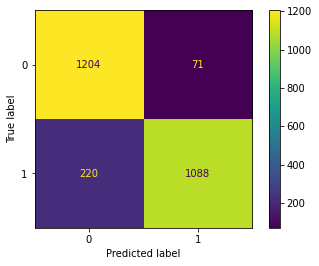

In [731]:
# Entrenar el modelo de Gradient Boosting
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
predictions = gb.predict(X_test)
# Evaluar la precisión del modelo
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=gb.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
# Aplicar validación cruzada 5 veces
cv_scores = cross_val_score(
    gb, X_train, y_train, cv=5, scoring='recall')

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada:")
for fold_idx, score in enumerate(cv_scores, start=1):
    print(f"Fold {fold_idx}: {score:.4f}")

# Calcular el promedio de los puntajes de validación cruzada
mean_cv_score = np.mean(cv_scores)
print("Promedio de Puntajes de Validación Cruzada:", mean_cv_score)


Obtenemos buenos resultados pero seguimos teniendo buenos, sin embargo, sigue siendo mejor XGB

### MLP

Metricas modelo base
     conteo  porcentaje
0.0    1330        51.0
1.0    1253        49.0
              precision    recall  f1-score   support

           0       0.84      0.87      0.86      1275
           1       0.87      0.84      0.85      1308

    accuracy                           0.85      2583
   macro avg       0.86      0.86      0.85      2583
weighted avg       0.86      0.85      0.85      2583

Resultados de la Validación Cruzada:
Fold 1: 0.8464
Fold 2: 0.8347
Fold 3: 0.8280
Fold 4: 0.8197
Fold 5: 0.8383
Promedio de Puntajes de Validación Cruzada: 0.833442960489705


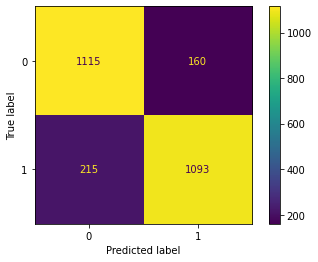

In [732]:
# Entrenar el modelo de Redes Neuronales
mlp = MLPClassifier(hidden_layer_sizes=(100, 100),
                    activation='relu', solver='adam', random_state=42)
mlp.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
predictions = mlp.predict(X_test)

# Evaluar la precisión del modelo
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=mlp.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
# Aplicar validación cruzada 5 veces
cv_scores = cross_val_score(
    mlp, X_train, y_train, cv=5, scoring='recall')

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada:")
for fold_idx, score in enumerate(cv_scores, start=1):
    print(f"Fold {fold_idx}: {score:.4f}")

# Calcular el promedio de los puntajes de validación cruzada
mean_cv_score = np.mean(cv_scores)
print("Promedio de Puntajes de Validación Cruzada:", mean_cv_score)


Obtuvimos un resultado similar a XGB, sin enmbargo, sigue siendo superior XGB

### ABC

Metricas modelo base
     conteo  porcentaje
0.0    1416        55.0
1.0    1167        45.0
              precision    recall  f1-score   support

           0       0.84      0.93      0.88      1275
           1       0.93      0.83      0.87      1308

    accuracy                           0.88      2583
   macro avg       0.88      0.88      0.88      2583
weighted avg       0.88      0.88      0.88      2583

Resultados de la Validación Cruzada:
Fold 1: 0.8247
Fold 2: 0.8280
Fold 3: 0.8214
Fold 4: 0.8047
Fold 5: 0.8117
Promedio de Puntajes de Validación Cruzada: 0.8180929326655537


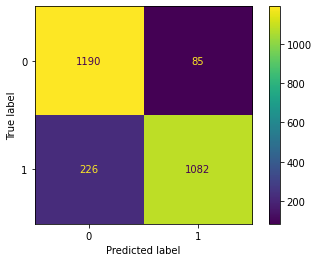

In [733]:
adaboost = AdaBoostClassifier(random_state=42)
adaboost.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
predictions = adaboost.predict(X_test)

# Evaluar la precisión del modelo
#Resultados
cm = confusion_matrix(y_test, predictions)
confusion = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=adaboost.classes_)

unique, counts = np.unique(
    labelencoder.inverse_transform(predictions), return_counts=True)
predictions_df = pd.DataFrame(counts, unique).rename(columns={0: "conteo"})
total = sum(counts)
predictions_df["porcentaje"] = round(predictions_df["conteo"] / total*100)
print("Metricas modelo base")
print(predictions_df)
modelo_base_metrics = classification_report(y_test, predictions)
print(modelo_base_metrics)
confusion.plot()
# Aplicar validación cruzada 5 veces
cv_scores = cross_val_score(
    adaboost, X_train, y_train, cv=5, scoring='recall')

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada:")
for fold_idx, score in enumerate(cv_scores, start=1):
    print(f"Fold {fold_idx}: {score:.4f}")

# Calcular el promedio de los puntajes de validación cruzada
mean_cv_score = np.mean(cv_scores)
print("Promedio de Puntajes de Validación Cruzada:", mean_cv_score)


No logra superan las metricas de XGB

Ultima validazión gráfica

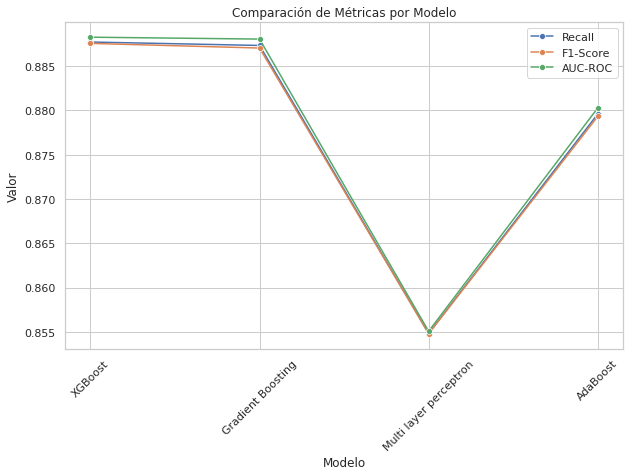

In [735]:
# Definir los modelos
modelos = [
    ("XGBoost", xgb_model),
    ("Gradient Boosting", gb),
    ("Multi layer perceptron", mlp),
    ("AdaBoost", adaboost)
]
# Crear una lista para almacenar los resultados
resultados = []

# Evaluar cada modelo y almacenar las métricas en la lista de resultados
for nombre, modelo in modelos:
    # Ajustar el modelo a los datos de entrenamiento
    modelo.fit(X_train, y_train)

    y_pred = modelo.predict(X_test)
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    auc_roc = roc_auc_score(
        y_test, y_pred, average='weighted', multi_class='ovr')

    resultados.append({
        'Modelo': nombre,
        'Recall': recall,
        'F1-Score': f1,
        'AUC-ROC': auc_roc
    })

# Crear un DataFrame con los resultados
df_resultados = pd.DataFrame(resultados)

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Configurar el tamaño y diseño del gráfico
plt.figure(figsize=(10, 6))

# Graficar cada métrica por separado para cada modelo
for metrica in ['Recall', 'F1-Score', 'AUC-ROC']:
    sns.lineplot(data=df_resultados, x='Modelo',
                 y=metrica, marker='o', label=metrica)

# Configurar las etiquetas de los ejes y la leyenda
plt.title('Comparación de Métricas por Modelo')
plt.xlabel('Modelo')
plt.ylabel('Valor')
plt.xticks(rotation=45)
plt.legend()

# Mostrar el gráfico
plt.show()


Nuevamente XGBoost se evidencia como mejor técnica. Se procede a mejorar hiperparametros

## Optimización Hiperparametros

In [739]:
# Definir los hiperparámetros a buscar
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5,7,9],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Definir el modelo
xgb_model = xgb.XGBClassifier()

# Realizar la búsqueda de hiperparámetros mediante validación cruzada
search = GridSearchCV(xgb_model, param_grid, scoring='recall', cv=5)
search.fit(X_train, y_train)

# Obtener los mejores hiperparámetros encontrados
best_params = search.best_params_

# Entrenar el modelo con los mejores hiperparámetros en los datos de entrenamiento completos
xgb_model_best = xgb.XGBClassifier(**best_params)
xgb_model_best.fit(X_train, y_train)

# Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
y_pred = xgb_model_best.predict(X_test)
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
auc_roc = roc_auc_score(y_test, y_pred, average='weighted', multi_class='ovr')

# Imprimir las métricas del modelo con los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:", best_params)
print("Recall:", recall)
print("F1-Score:", f1)
print("AUC-ROC:", auc_roc)


Mejores hiperparámetros encontrados: {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}
Recall: 0.886566008517228
F1-Score: 0.8863918192024767
AUC-ROC: 0.8871361755711458


In [740]:
data_model.columns

Index(['qPersonas', 'qMascotas', 'localidad', 'nombrePlan', 'agricultor',
       'comerciante', 'docente', 'empleado', 'estudiante', 'hogar',
       'independiente', 'oficiosVarios', 'pensionado', 'esposa', 'esposo',
       'hermana', 'hermano', 'hija', 'hijo', 'madre', 'edad', 'diaPagoCuota',
       'duracion', 'promPercDesc', 'gestionExitosa', 'gestionNoEjecutada',
       'promedioEdadInscritos', 'estado'],
      dtype='object')